# **Myeloid subcluster**

In [ ]:
import sys
sys.path.append("../code")
from code.data_prep.io import *
from code.data_prep.processing import *
from code.plotting.plot_settings import *
from code.plotting.palette import *

In [1]:
import scanpy as sc
from pathlib import Path
import numpy as np
import pandas as pd
import scrublet as scr

import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
%matplotlib inline
sc.settings.verbosity=3

In [3]:
main_dir = "/projects/robson-lab/research/endometriosis/"
sample_id = "Endometriosis-revision-3"
sub_dir = "Myeloid"

sc.settings.figdir = f"{main_dir}figures/{sample_id}"
matplotlib.rcParams["figure.facecolor"]="white"

---

---

In [6]:
full = sc.read_h5ad(f"{main_dir}data/h5ad/{sample_id}/{sub_dir}/{sample_id}-Mye-20220103.h5ad")

In [7]:
full.X.max()

8.765902

#### Batch Corrections & UMAP Computing

In [8]:
%load_ext rpy2.ipython

In [9]:
sc.pp.pca(full, svd_solver="arpack",use_highly_variable=True)

    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:00)


In [10]:
pcs = full.obsm["X_pca"]
metadata = full.obs
covariates = ["Patient_id","stage"]
thetas = np.array([2,1])

In [11]:
%%R -i pcs -i covariates -i thetas -i metadata -o pcs_harmony
library(harmony)
pcs_harmony <- HarmonyMatrix(
    pcs,
    metadata,
    vars_use=covariates,
    theta=thetas,
    do_pca=FALSE
)

R[write to console]: Loading required package: Rcpp

R[write to console]: Harmony 1/10

R[write to console]: 0%   10   20   30   40   50   60   70   80   90   100%

R[write to console]: [----|----|----|----|----|----|----|----|----|----|

R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[

In [13]:
harmonized = load_pcs(full, pcs_harmony)

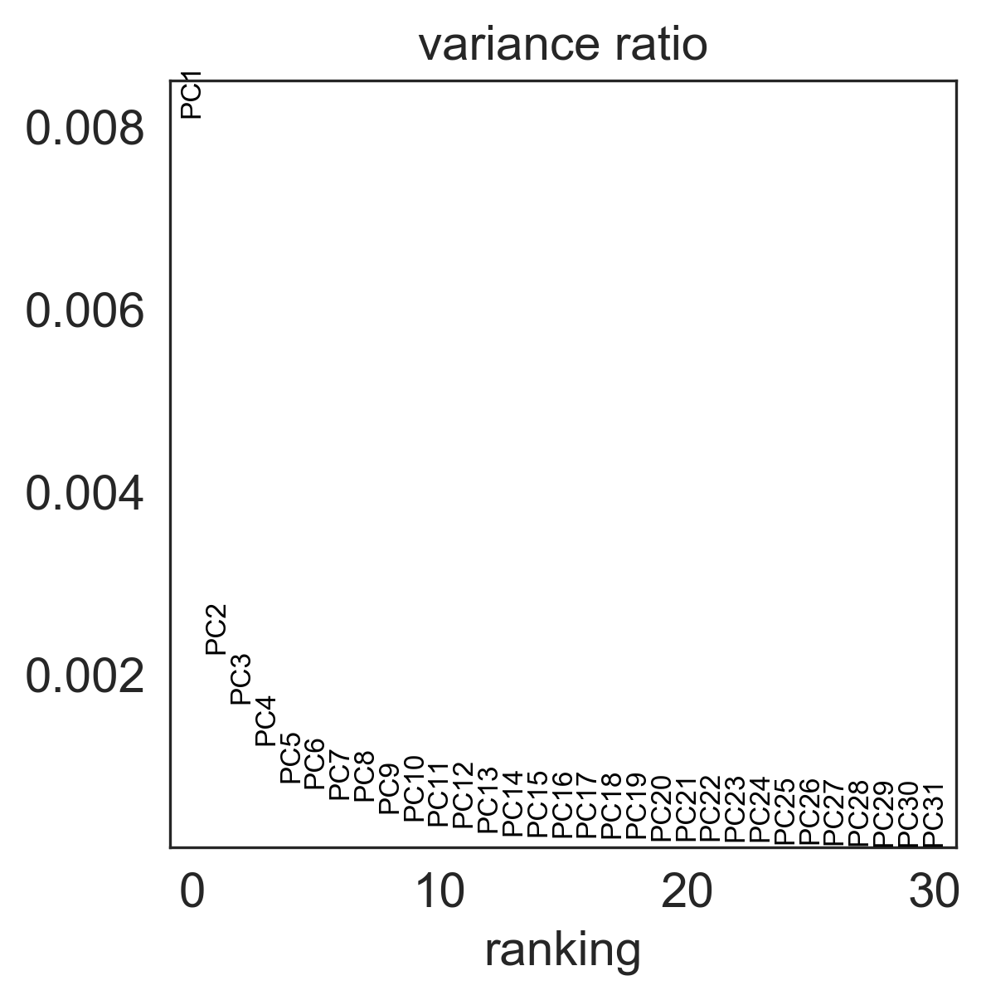

In [14]:
sc.pl.pca_variance_ratio(harmonized,show=False)

In [ ]:
sc.pp.neighbors(harmonized, n_neighbors=25, n_pcs=15, metric="correlation")
sc.tl.umap(harmonized, min_dist=0.05)

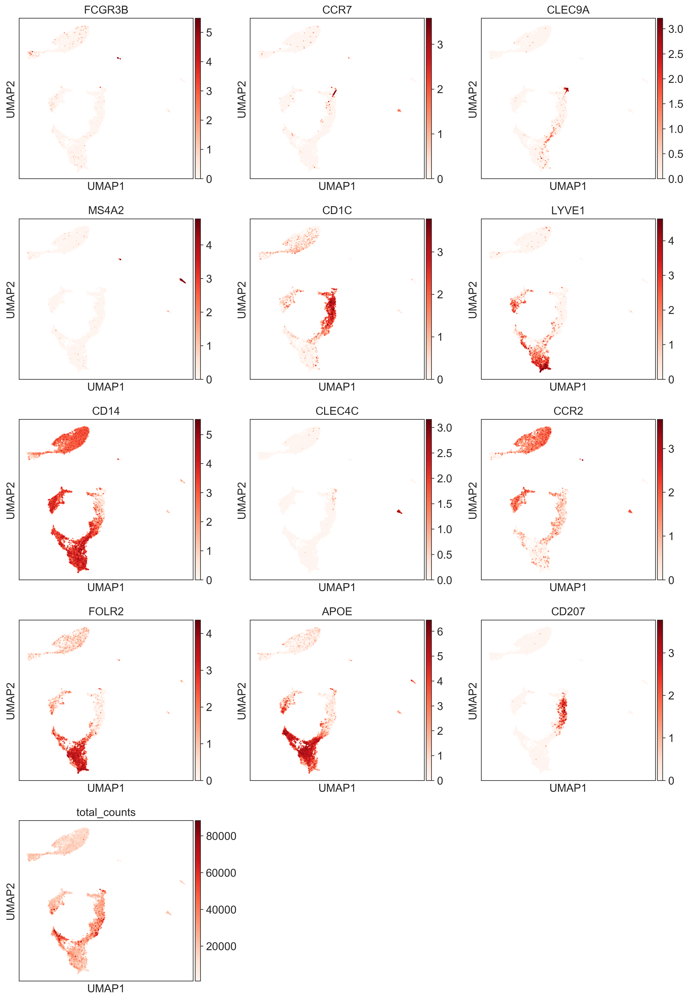

In [28]:
sc.pl.umap(harmonized, color = ["FCGR3B","CCR7","CLEC9A","MS4A2","CD1C","LYVE1","CD14","CLEC4C","CCR2","FOLR2","APOE","CD207","total_counts"],ncols=3,cmap="Reds")

---

#### Clustering

running Leiden clustering
    finished: found 25 clusters and added
    'mye_leiden_R4', the cluster labels (adata.obs, categorical) (0:00:00)


/opt/conda/lib/python3.7/site-packages/scanpy/tools/_leiden.py:111: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adjacency = adata.uns['neighbors']['connectivities']


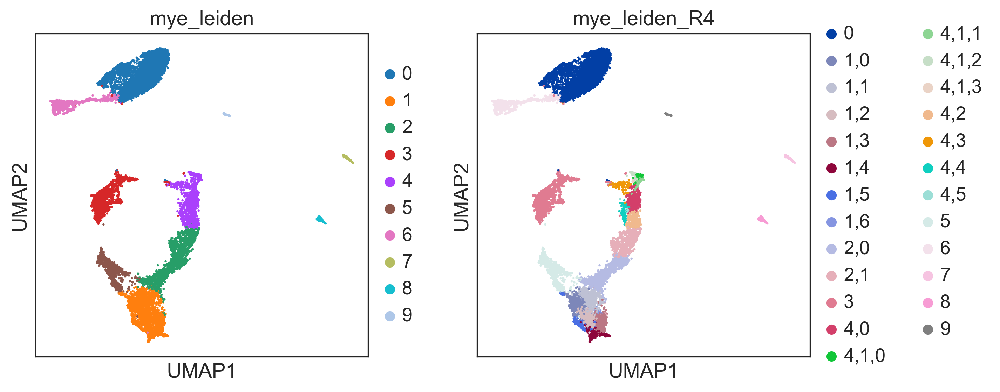

In [55]:
sc.tl.leiden(harmonized, resolution=0.4,key_added="mye_leiden")
sc.tl.leiden(harmonized, resolution= 0.6, restrict_to= ('mye_leiden',["1"]),key_added='mye_leiden_R1')
sc.tl.leiden(harmonized, resolution= 0.2, restrict_to= ('mye_leiden_R1',["2"]),key_added='mye_leiden_R2')
sc.tl.leiden(harmonized, resolution= 0.5, restrict_to= ('mye_leiden_R2',["4"]),key_added='mye_leiden_R3')
sc.tl.leiden(harmonized, resolution= 0.5, restrict_to= ('mye_leiden_R3',["4,1"]),key_added='mye_leiden_R4')
sc.pl.umap(harmonized, color=["mye_leiden","mye_leiden_R4"])

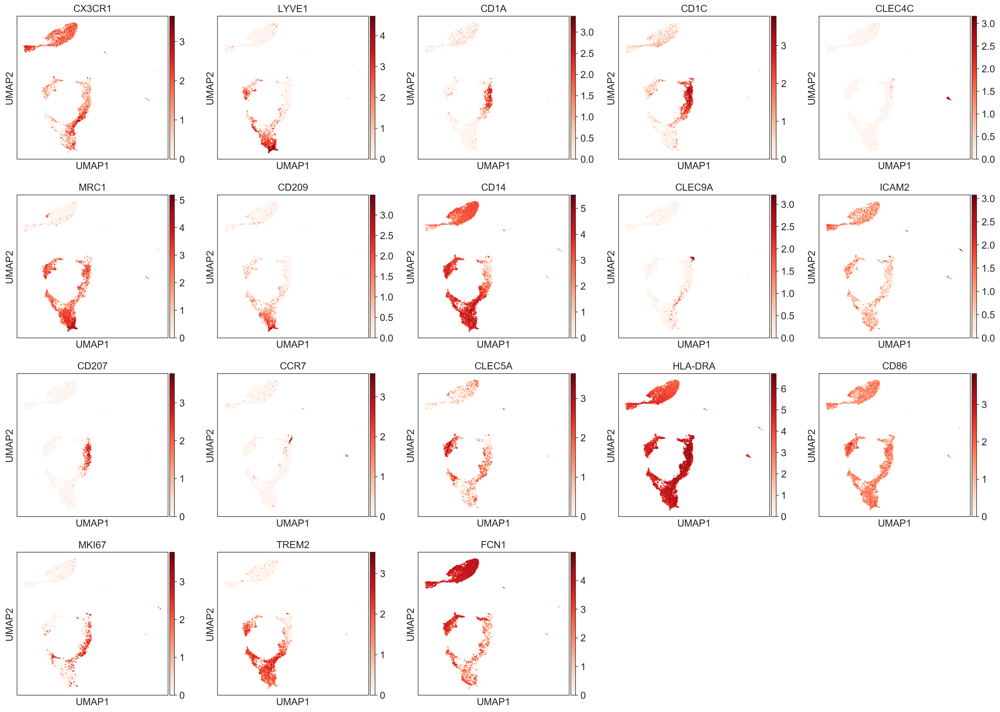

In [56]:
sc.pl.umap(harmonized, color=["CX3CR1","LYVE1","CD1A","CD1C","CLEC4C",
                              "MRC1","CD209","CD14","CLEC9A","ICAM2",
                              "CD207","CCR7","CLEC5A","HLA-DRA","CD86","MKI67","TREM2","FCN1"], 
           ncols=5, color_map="Reds")

In [57]:
save_adata(harmonized, "harmonized-Mye", subdir=sub_dir)

---

In [6]:
harmonized = sc.read(f"{main_dir}data/h5ad/{sample_id}/{sub_dir}/{sample_id}-harmonized-Mye-20220103.h5ad")

#### Doublet Identification

***Visible doublet***

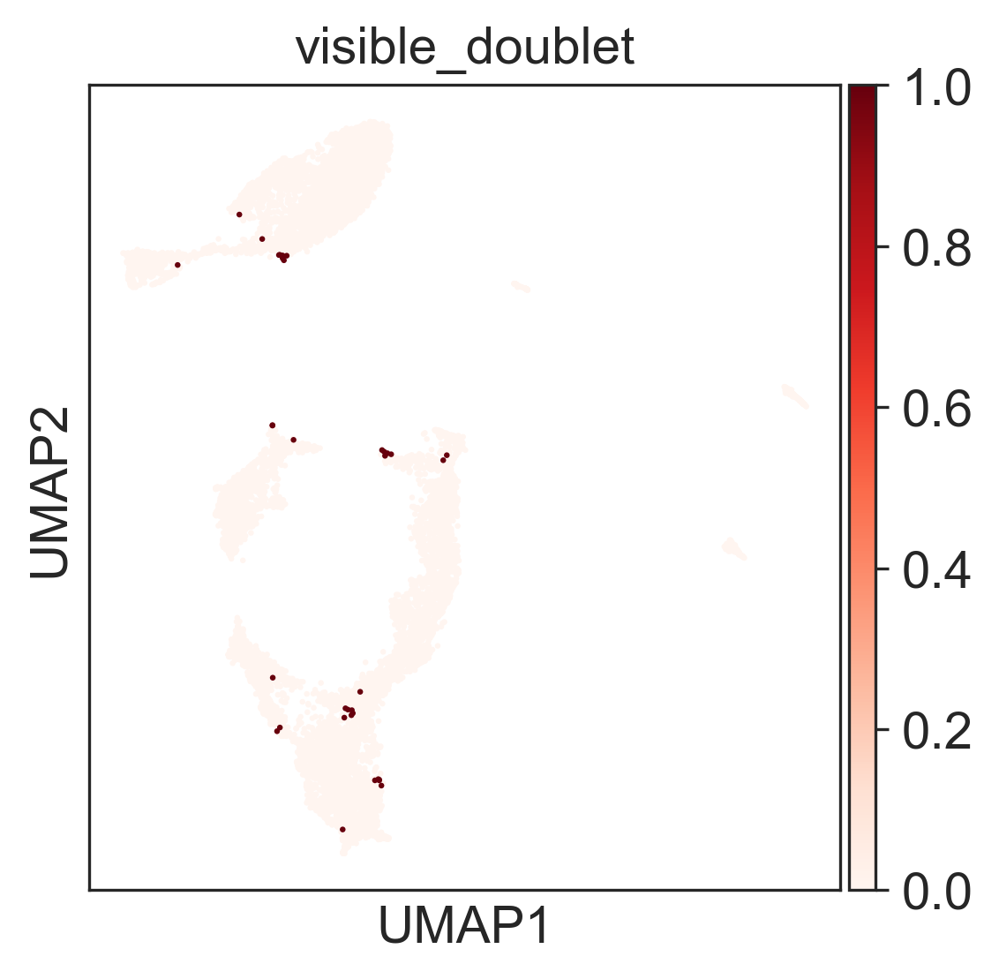

In [60]:
detect_umap_doublets(harmonized, cluster_key= "mye_leiden_R4", t=10)
sc.pl.umap(harmonized,color=["visible_doublet"], color_map="Reds")

In [61]:
clean = harmonized[~harmonized.obs.visible_doublet,:].copy()

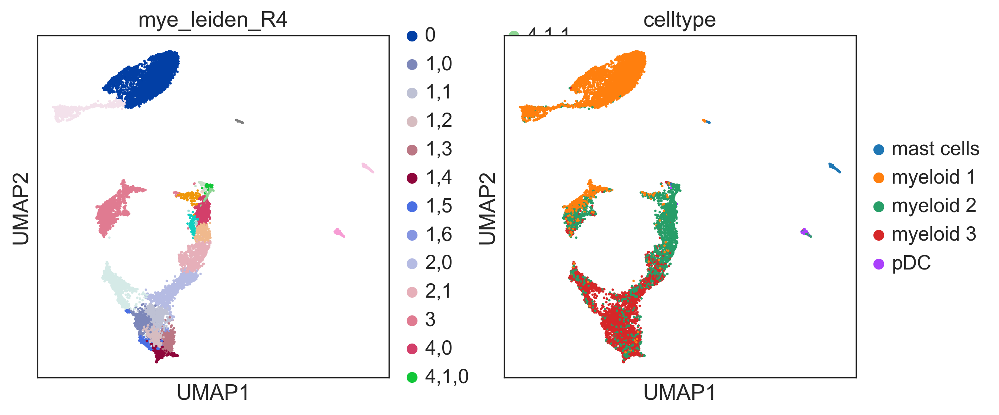

In [62]:
sc.pl.umap(clean,color=["mye_leiden_R4","celltype"], color_map="Reds")

In [64]:
reorder_clusters_hierarchical(clean,cluster_key="mye_leiden_R4",new_key='mye_cluster')

AnnData object with n_obs × n_vars = 12335 × 21606
    obs: 'sequencing_saturation', 'Patient_id', 'stage', 'scrublet_predicted_doublet', 'scrublet_score', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mitochondrial', 'log1p_total_counts_mitochondrial', 'pct_counts_mitochondrial', 'total_counts_hemoglobin', 'log1p_total_counts_hemoglobin', 'pct_counts_hemoglobin', 'library', '10x_chemistry', 'sample_name', 'sampleid', 'sample_type', 'leiden', 'leiden_R1', 'leiden_R2', 'leiden_R3', 'leiden_R4', 'leiden_R5', 'leiden_R6', 'leiden_R7', 'cluster', 'cluster_R1', 'celltype', 'celltype_main', 'mye_leiden', 'mye_leiden_R1', 'mye_leiden_R2', 'mye_leiden_R3', 'mye_leiden_R4', 'visible_doublet', 'mye_cluster'
    var: 'gene_ids', 'mitochondrial', 'hemoglobin', 'total_counts', 'n_cells_by_counts', 'ribosomal', 'cell_cycle', 

... storing 'mye_cluster' as categorical


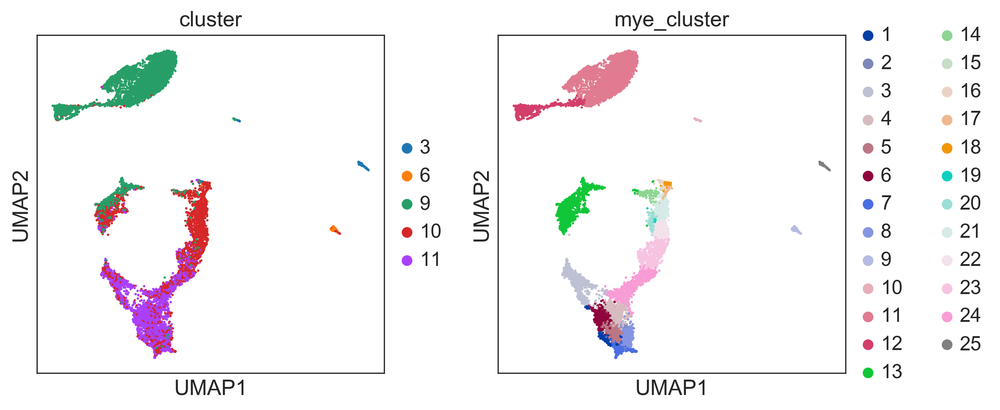

In [65]:
sc.pl.umap(clean, color=["cluster","mye_cluster"])

In [66]:
save_adata(clean,"scrubs-clean-mye",subdir=sub_dir)

---
### Final Subtypes Clustering
date: Jan 03rd, 2022
<br> Final clustering based on previous analysis (cell type markers, differential gene expression, literature reviews)

In [100]:
clean = sc.read(f"{main_dir}data/h5ad/{sample_id}/{sub_dir}/{sample_id}-scrubs-clean-mye-20220103.h5ad")

In [104]:
clean.obs["mye_cluster_R1"] = clean.obs.mye_cluster.map({
    "1":"1",
    "2":"2",
    "3":"3",
    "4":"2",
    "5":"2",
    "6":"2",
    "7":"2",
    "8":"2",
    "9":"4",
    "10":"5",
    "11":"6",
    "12":"7",
    "13":"8",
    "14":"9",
    "15":"10",
    "16":"10",
    "17":"11",
    "18":"12",
    "19":"13",
    "20":"13",
    "21":"13",
    "22":"13",
    "23":"14",
    "24":"15",
    "25":"16"
})

Trying to set attribute `.obs` of view, copying.
... storing 'mye_cluster_R1' as categorical


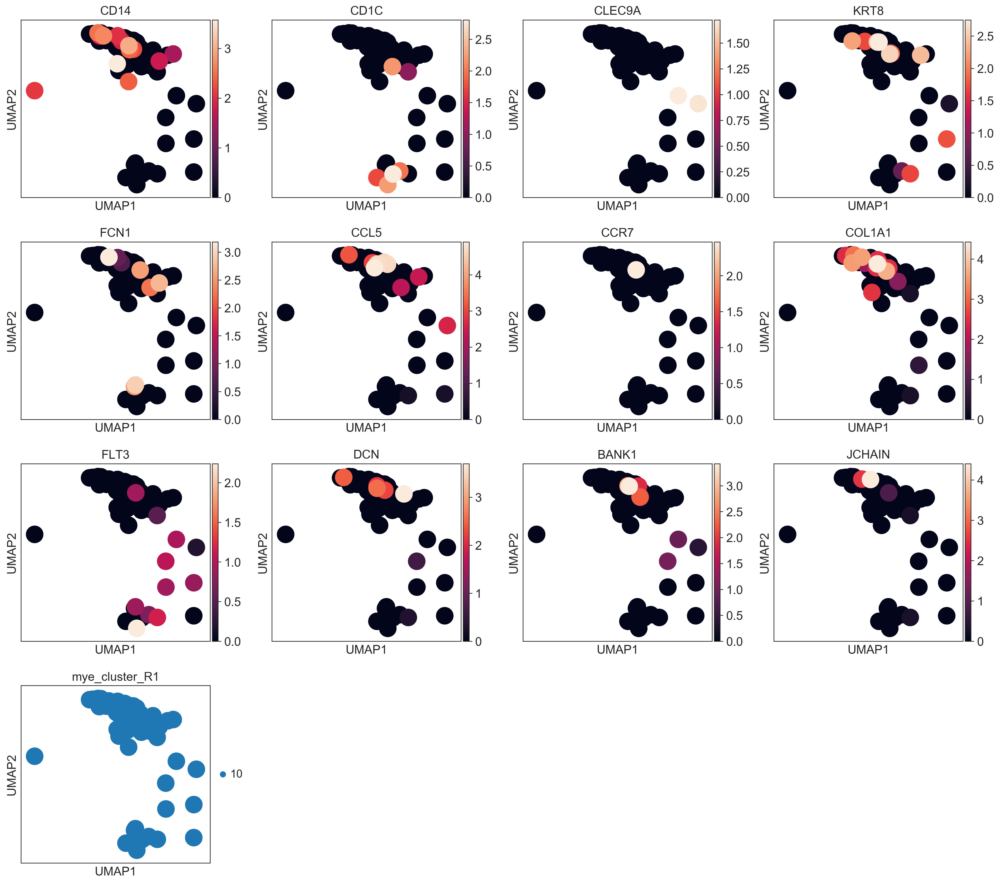

In [105]:
#suspicious cluster #10, check markers! 
sc.pl.umap(clean[clean.obs.mye_cluster_R1.isin(["10"])],color=["CD14","CD1C","CLEC9A","KRT8","FCN1","CCL5","CCR7","COL1A1","FLT3",
                                                                "DCN","BANK1","JCHAIN","mye_cluster_R1"]) 

#looks like debri, express a little bit of everything --> will be removed

In [ ]:
clean = clean[clean.obs.mye_cluster_R1 !="10"].copy()

In [107]:
clean.obs["subtypes"] = clean.obs.mye_cluster_R1.map({
    "1":"M$\Phi$2-peritoneal",
    "2":"M$\Phi$1-LYVE1",
    "3":"M$\Phi$5-activated",
    "4":"pDC",
    "5":"granulocytes",
    "6":"monocytes-CD16-",
    "7":"monocytes-CD16+",
    "8":"M$\Phi$4-infiltrated",
    "9":"DC3",
    "11":"mDC",
    "12":"cDC1",
    "13":"cDC2",
    "14":"pre-cDC2",
    "15":"M$\Phi$3-APOE",
    "16":"mast cells",
})

In [108]:
clean.obs["subtypes"].value_counts()

monocytes-CD16-         3475
M$\Phi$1-LYVE1          2028
M$\Phi$4-infiltrated    1478
M$\Phi$3-APOE            904
M$\Phi$5-activated       877
cDC2                     859
monocytes-CD16+          838
pre-cDC2                 738
mast cells               296
pDC                      201
M$\Phi$2-peritoneal      155
DC3                      143
cDC1                     108
mDC                       84
granulocytes              78
Name: subtypes, dtype: int64

... storing 'subtypes' as categorical


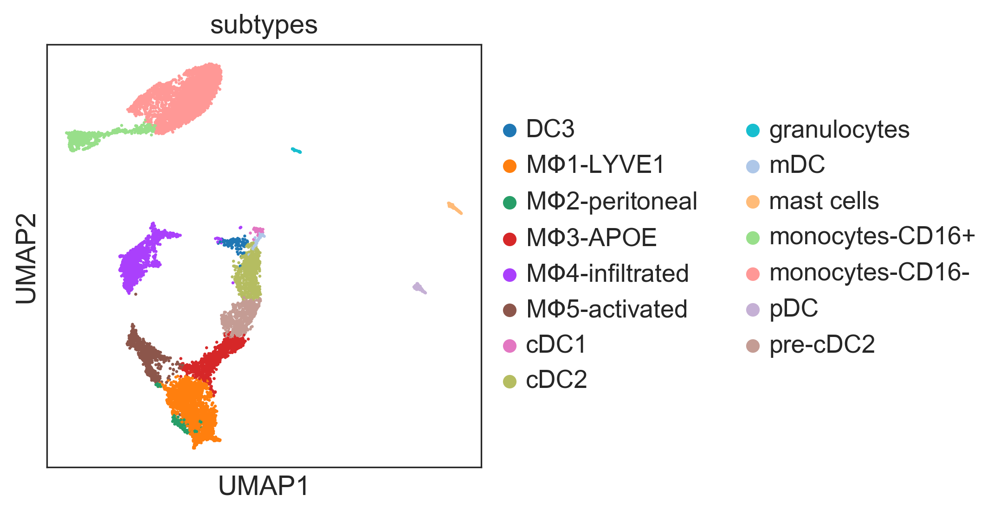

In [109]:
sc.pl.umap(clean, color=["subtypes"])

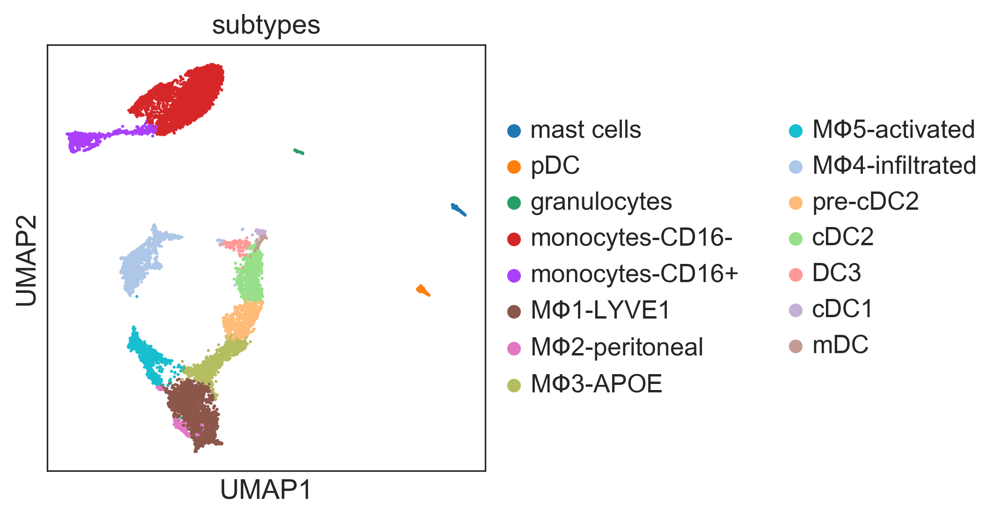

In [111]:
clean.obs["subtypes"].cat.reorder_categories([
    "mast cells","pDC","granulocytes","monocytes-CD16-","monocytes-CD16+",
    "M$\Phi$1-LYVE1","M$\Phi$2-peritoneal","M$\Phi$3-APOE","M$\Phi$5-activated","M$\Phi$4-infiltrated",
    "pre-cDC2","cDC2","DC3","cDC1","mDC"
],
    inplace=True)

sc.pl.umap(clean, color=["subtypes"])

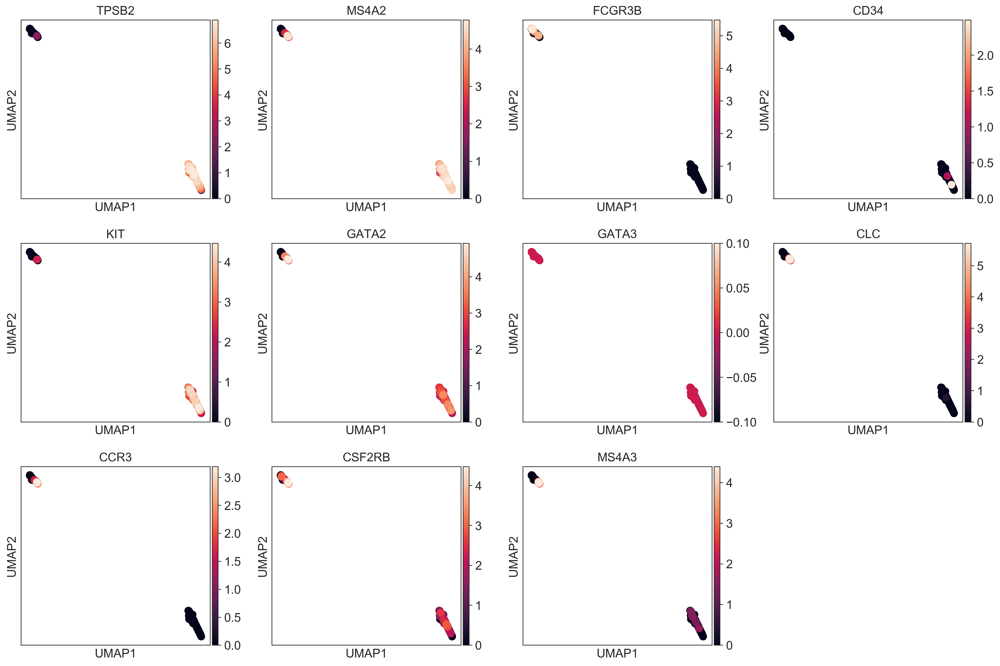

In [112]:
#define granulocytes population
granulocytes = clean[clean.obs.subtypes.isin(["granulocytes","mast cells"])]
gmp = ["GATA2","GATA3","CLC","CCR3","CSF2RB","MS4A3"]
sc.pl.umap(granulocytes, color=["TPSB2","MS4A2","FCGR3B","CD34","KIT"]+gmp)

In [113]:
pbmc = ["FCER1A","MS4A2","TPSB2","CLEC4C","JCHAIN","CLC","MS4A3","FCGR3B","MME","CD14","FCGR3A","RIPOR2","S100A12","CCR2","CDKN1C"]
mac = ["CLEC5A","VEGFA","MRC1","CD163","C1QB","C1QC","FOLR2","SELENOP","IGF1","LYVE1","SLC2A5","CX3CR1","FCGBP","GPR34"]
dc = ["PKIB","CLEC10A","CD1C","CD1E","CD207","CD1A","IDO1","CLEC9A","RGCC","XCR1","CLNK","CCR7","LAMP3"]
add = ["CD68","HLA-DRA","HLA-DRB1"]

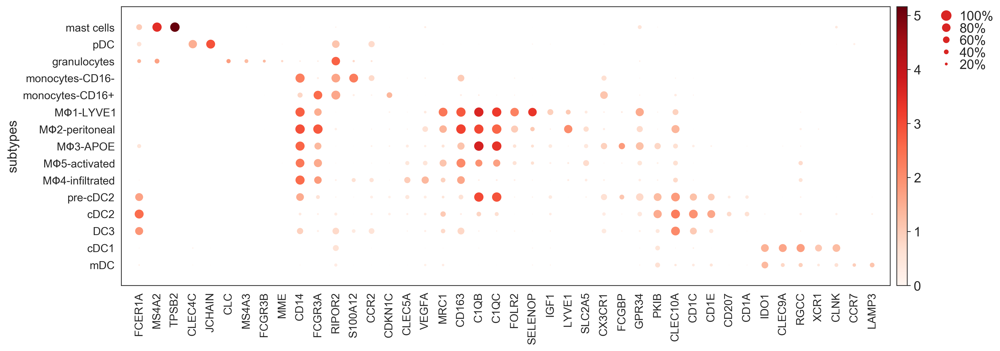

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[14.7, 0, 0.2, 0.5, 0.25])

In [114]:
sc.pl.dotplot(clean,pbmc+mac+dc, groupby="subtypes")

In [115]:
save_adata(clean,"final-mye",subdir=sub_dir)

---

***Cell_type Markers***

Note:
`sc.tl.rank_genes_groups(adata, groupby="cluster",use_raw=False,)` and `sc.tl.filter_rank_genes_groups(clean, use_raw=False)` will cause warning for adata saving, and subsequently error in adata loading. Copy the adata and run this function for doublet identification purpose. Once `doublet` identified, filter and save the original `adata`.

In [116]:
clean_copy = clean.copy()
#clean_copy.raw = sc.AnnData(clean_copy.layers["raw"], var=clean_copy.var, obs=clean_copy.obs)
clean_copy.raw = clean_copy
sc.tl.rank_genes_groups(clean_copy, groupby="subtypes",use_raw=False, method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:19)


Filtering genes using: min_in_group_fraction: 0.7 min_fold_change: 0.8, max_out_group_fraction: 0.3
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_subtypes']`
categories: mast cells, pDC, granulocytes, etc.
var_group_labels: mast cells, pDC, monocytes-CD16-, etc.


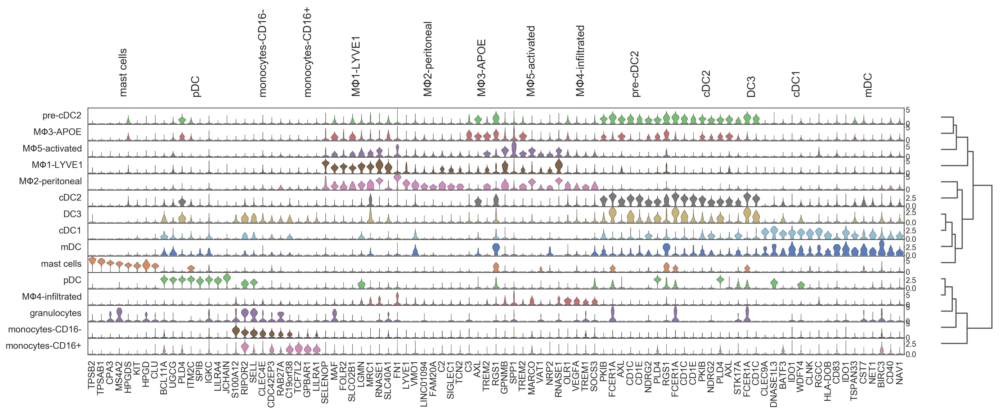

In [117]:
sc.tl.filter_rank_genes_groups(clean_copy,use_raw=False,
                               min_in_group_fraction= 0.7, max_out_group_fraction=0.3, min_fold_change=0.8)
sc.pl.rank_genes_groups_stacked_violin(clean_copy,key='rank_genes_groups_filtered', n_genes=8)

---